In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import lightgbm as lgb

In [30]:
from pandas.tseries.offsets import Day, Week
from sklearn.metrics import mean_squared_error, mean_absolute_error
from hyperopt import hp, fmin, tpe, STATUS_OK, Trials

In [3]:
data = pd.read_parquet('/main/data/MVideo_2/dataset_main_5_2.parquet')

In [5]:
data = data.sort_values(['STORE_ID', 'PRODUCT_ID', 'DATE']).reset_index(drop = True)

In [7]:
data[['PRODUCT_ID', 'MAINCATEGORY_ID', 'SUBCATEGORY_ID',
      'STORE_ID', 'REGION', 'INTERNET',
      'WEEK(DATE)', 'MONTH(DATE)', 'CLUSTER']] = data[['PRODUCT_ID', 'MAINCATEGORY_ID', 'SUBCATEGORY_ID',
                                                       'STORE_ID', 'REGION', 'INTERNET',
                                                       'WEEK(DATE)', 'MONTH(DATE)', 'CLUSTER']].astype('category')

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2831698 entries, 0 to 2831697
Columns: 132 entries, DATE to NUM_STORES
dtypes: category(9), datetime64[ns](1), float32(102), int32(20)
memory usage: 1.3 GB


In [9]:
data.DATE.min()

Timestamp('2016-09-04 00:00:00')

In [10]:
data.DATE.max()

Timestamp('2018-07-01 00:00:00')

In [11]:
data_train = data[data.DATE < '2018-03-18']

In [12]:
data_train.shape[0]

2377102

In [13]:
data_val = data[(data.DATE >= '2018-03-18') & (data.DATE < '2018-05-13')]

In [14]:
data_val.shape[0]

226359

In [15]:
data_test = data[data.DATE >= '2018-05-13']

In [16]:
data_test.shape[0]

228237

In [17]:
feat = [s for s in data.columns if s not in ['DATE', 'UNITS_SOLD_P1']]

In [18]:
dts = lgb.Dataset(data_train[feat], label = data_train.UNITS_SOLD_P1)

In [19]:
dts = dts.construct()

In [20]:
dtsv = dts.create_valid(data_val[feat], label = data_val.UNITS_SOLD_P1)

In [21]:
params = {
    'application': 'regression_l2',
    'learning_rate': 0.03,
    'num_leaves': 31,
    'min_data_in_leaf': 810,
    'min_sum_hessian_in_leaf': 100,
    'feature_fraction': 0.5,
    'bagging_fraction': 1.0,
    'bagging_freq': 4,
    'lambda_l2': 0.0028,
    'metric': 'l2_root'}

In [22]:
bst = lgb.train(params, dts, valid_sets = [dtsv], valid_names = ['Validation'],
                num_boost_round = 10000, early_stopping_rounds = 20)

[1]	Validation's rmse: 0.887678
Training until validation scores don't improve for 20 rounds.
[2]	Validation's rmse: 0.882545
[3]	Validation's rmse: 0.877745
[4]	Validation's rmse: 0.873079
[5]	Validation's rmse: 0.86898
[6]	Validation's rmse: 0.864285
[7]	Validation's rmse: 0.860071
[8]	Validation's rmse: 0.856595
[9]	Validation's rmse: 0.853181
[10]	Validation's rmse: 0.850184
[11]	Validation's rmse: 0.84694
[12]	Validation's rmse: 0.843687
[13]	Validation's rmse: 0.840626
[14]	Validation's rmse: 0.837428
[15]	Validation's rmse: 0.834885
[16]	Validation's rmse: 0.832389
[17]	Validation's rmse: 0.829954
[18]	Validation's rmse: 0.82761
[19]	Validation's rmse: 0.825186
[20]	Validation's rmse: 0.823412
[21]	Validation's rmse: 0.82203
[22]	Validation's rmse: 0.820039
[23]	Validation's rmse: 0.818673
[24]	Validation's rmse: 0.816572
[25]	Validation's rmse: 0.815153
[26]	Validation's rmse: 0.813807
[27]	Validation's rmse: 0.812437
[28]	Validation's rmse: 0.810804
[29]	Validation's rmse: 0.8

[248]	Validation's rmse: 0.776694
[249]	Validation's rmse: 0.776694
[250]	Validation's rmse: 0.776658
[251]	Validation's rmse: 0.776639
[252]	Validation's rmse: 0.776638
[253]	Validation's rmse: 0.776658
[254]	Validation's rmse: 0.776651
[255]	Validation's rmse: 0.776656
[256]	Validation's rmse: 0.776668
[257]	Validation's rmse: 0.776692
[258]	Validation's rmse: 0.776677
[259]	Validation's rmse: 0.776677
[260]	Validation's rmse: 0.776658
[261]	Validation's rmse: 0.776639
[262]	Validation's rmse: 0.776631
[263]	Validation's rmse: 0.77663
[264]	Validation's rmse: 0.776673
[265]	Validation's rmse: 0.776614
[266]	Validation's rmse: 0.776561
[267]	Validation's rmse: 0.776523
[268]	Validation's rmse: 0.776511
[269]	Validation's rmse: 0.776525
[270]	Validation's rmse: 0.776487
[271]	Validation's rmse: 0.776503
[272]	Validation's rmse: 0.776519
[273]	Validation's rmse: 0.776516
[274]	Validation's rmse: 0.776554
[275]	Validation's rmse: 0.77657
[276]	Validation's rmse: 0.776548
[277]	Validation

In [23]:
pred = bst.predict(data_val[feat])

In [57]:
res = data_val[['DATE', 'PRODUCT_ID', 'STORE_ID', 'UNITS_SOLD_P1']].copy()

In [58]:
res['PRED_P1'] = pred

In [59]:
res.PRED_P1.clip(lower = 0, inplace = True)

In [61]:
tres = res[['DATE', 'PRODUCT_ID', 'STORE_ID', 'PRED_P1']].copy()

In [62]:
tres.DATE += Week()

In [63]:
tres.rename(columns = {'PRED_P1': 'PRED_P0'}, inplace = True)

In [64]:
tres.PRED_P0.min()

0.0

In [65]:
res = res.merge(tres, how = 'left')

In [37]:
pred1 = res.PRED_P1.values

In [38]:
pred0 = res.PRED_P0.values

In [146]:
def cpred(alpha, beta, p1, p0):
    return np.maximum(np.floor(p1) + ((p1 - np.floor(p1)) > alpha), np.floor(p1) + ((p1 - p0) > beta))

In [147]:
space = {
        'alpha': hp.uniform('alpha', 0, 1),
        'beta': hp.uniform('beta', 0, 1)
       }

In [148]:
def objective_reg(space):
    test_loss = np.sqrt(mean_squared_error(res.UNITS_SOLD_P1, cpred(space['alpha'], space['beta'], pred1, pred0)))
    return{'loss': test_loss, 'status': STATUS_OK, 'attachments': params}

In [149]:
N_HYPEROPT_PROBES = 1000
HYPEROPT_ALGO = tpe.suggest #hyperopt.rand.suggest

trials = Trials()
best = fmin(fn=objective_reg,
            space=space,
            algo=HYPEROPT_ALGO,
            max_evals=N_HYPEROPT_PROBES,
            trials=trials,
            verbose=1)

/home/i347500/miniconda3/envs/mvideo/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


In [150]:
best

{'alpha': 0.43643375918859384, 'beta': 0.5273365144325459}

In [151]:
trials.results

[{'loss': 0.925018102196247, 'status': 'ok'},
 {'loss': 0.8362393500942763, 'status': 'ok'},
 {'loss': 0.8266407197505709, 'status': 'ok'},
 {'loss': 0.863802896119492, 'status': 'ok'},
 {'loss': 0.8457891168898393, 'status': 'ok'},
 {'loss': 0.8658283478553065, 'status': 'ok'},
 {'loss': 0.852712912108077, 'status': 'ok'},
 {'loss': 0.8320315067061711, 'status': 'ok'},
 {'loss': 0.8635880681241458, 'status': 'ok'},
 {'loss': 0.8388950686118392, 'status': 'ok'},
 {'loss': 0.815995944138678, 'status': 'ok'},
 {'loss': 0.8740955086886032, 'status': 'ok'},
 {'loss': 0.843637014840421, 'status': 'ok'},
 {'loss': 0.8179561465609537, 'status': 'ok'},
 {'loss': 0.8152755708227444, 'status': 'ok'},
 {'loss': 0.8423819236010859, 'status': 'ok'},
 {'loss': 0.8704692552402123, 'status': 'ok'},
 {'loss': 0.8323102144478799, 'status': 'ok'},
 {'loss': 0.9429027517912802, 'status': 'ok'},
 {'loss': 0.8157306174567722, 'status': 'ok'},
 {'loss': 0.8147280949032127, 'status': 'ok'},
 {'loss': 0.816125

In [108]:
def plot_ts(df, store_id, product_id):
    data_part = df[(df['STORE_ID'] == store_id) & (df['PRODUCT_ID'] == product_id)]
    week_range = data_part.DATE.drop_duplicates().sort_values().values
    #week_range = np.arange(data_part['DATE'].min(), data_part['DATE'].max())# + 1)
    ts = pd.DataFrame()
    ts['DATE'] = week_range
    df = pd.merge(ts, data_part, on = 'DATE', how = 'left')[['DATE', 'UNITS_SOLD_P1', 'PRED_P1']].fillna(0)
    plt.figure(figsize=(15, 4))
    plt.plot(df['DATE'].values, df['UNITS_SOLD_P1'].values, 'g^-', label='true')
    plt.plot(df['DATE'].values, df['PRED_P1'].values, 'ro-', label='pred')
    plt.xlabel('# Week')
    plt.ylabel('Units sold')
    max_y = max(1, df['UNITS_SOLD_P1'].max(), df['PRED_P1'].max())
    plt.ylim((-0.05, max_y + 0.1))
    plt.title('The ts for product - %s and store - %s' % (product_id, store_id))
    plt.legend(loc='best')
    plt.show()

In [109]:
data_train2 = data[data.DATE < '2018-05-13']

In [110]:
dts2 = lgb.Dataset(data_train2[feat], label = data_train2.UNITS_SOLD_P1)

In [111]:
dts2 = dts2.construct()

In [112]:
bst2 = lgb.train(params, dts2, num_boost_round = 290)

In [113]:
pred2 = bst2.predict(data_test[feat])

In [152]:
res2 = data_test[['DATE', 'PRODUCT_ID', 'STORE_ID', 'UNITS_SOLD_P1']].copy()

In [153]:
res2['PRED_P1'] = pred2

In [154]:
res2.PRED_P1.clip(lower = 0, inplace = True)

In [155]:
tres = res2[['DATE', 'PRODUCT_ID', 'STORE_ID', 'PRED_P1']].copy()

In [156]:
tres.DATE += Week()

In [157]:
tres.rename(columns = {'PRED_P1': 'PRED_P0'}, inplace = True)

In [158]:
res2 = res2.merge(tres, how = 'left')

In [159]:
pred21 = res2.PRED_P1.values

In [160]:
pred20 = res2.PRED_P0.values

In [161]:
pred22 = cpred(best['alpha'], best['beta'], pred21, pred20)

/home/i347500/miniconda3/envs/mvideo/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


In [162]:
pred22[0:50]

array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 1., 1.,
       0., 1., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.])

In [163]:
np.sqrt(mean_squared_error(res2.UNITS_SOLD_P1, pred22))

0.8339038167868194

In [164]:
mean_absolute_error(res2.UNITS_SOLD_P1, pred22)

0.39706533121273063

In [165]:
res22 = res2[['DATE', 'PRODUCT_ID', 'STORE_ID', 'UNITS_SOLD_P1']].copy()

In [166]:
res22['PRED_P1'] = pred22

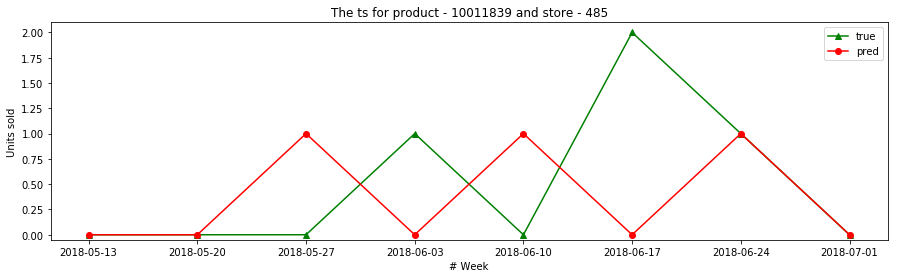

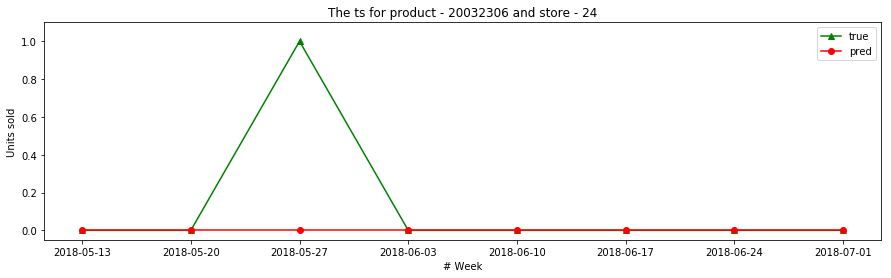

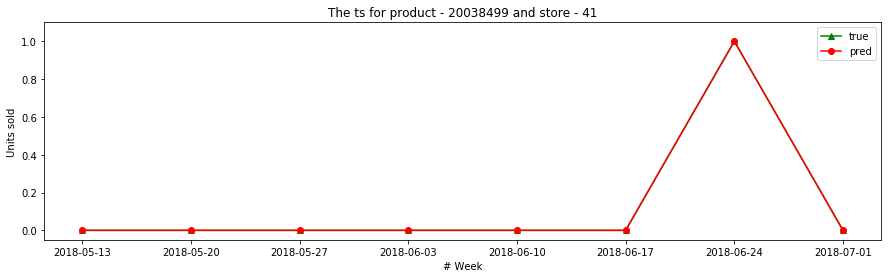

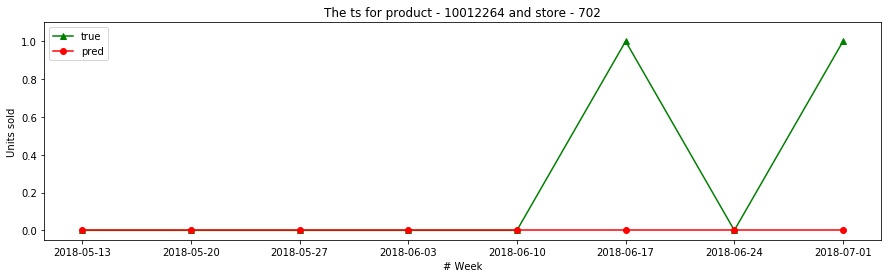

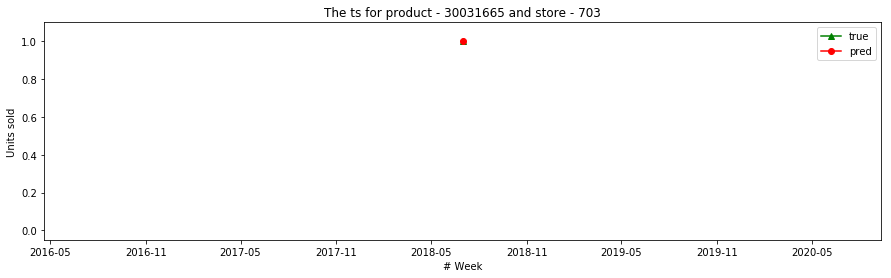

...

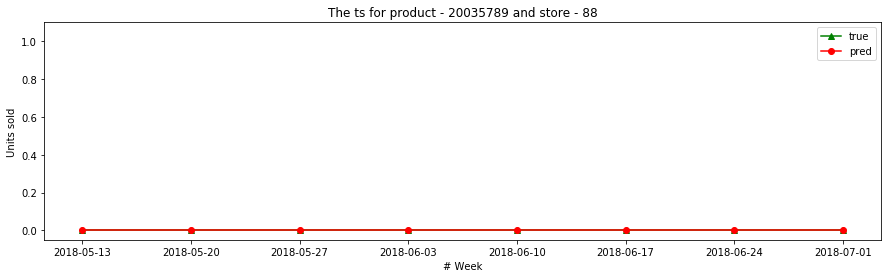

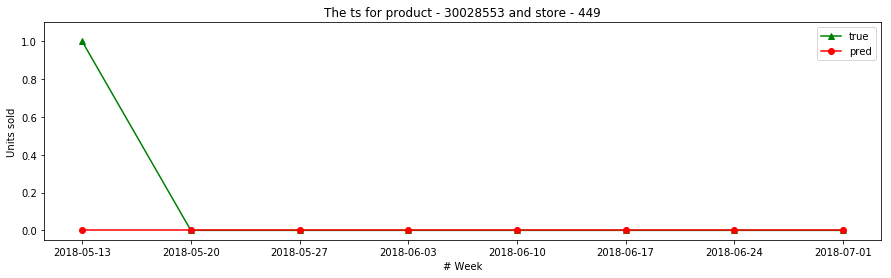

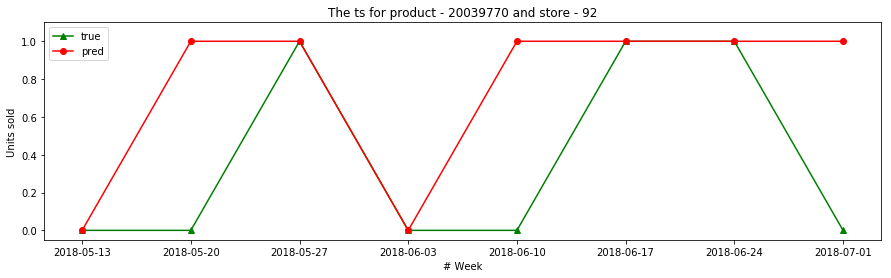

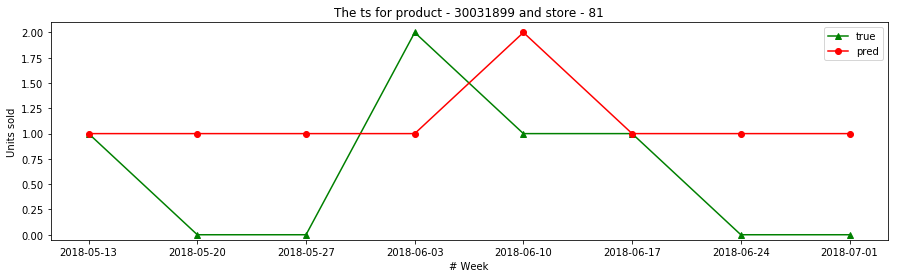

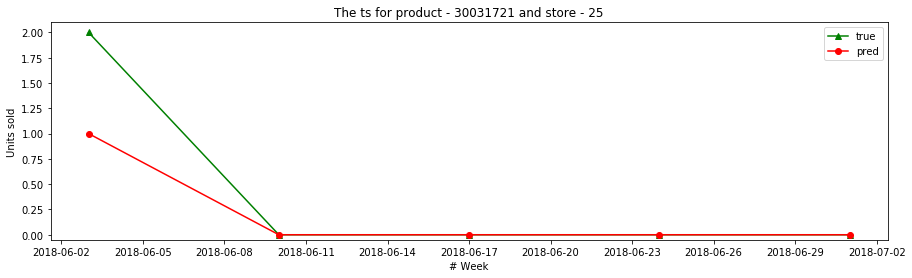

In [167]:
pairs = list(set(zip(res22['STORE_ID'], res22['PRODUCT_ID'])))

for i in range(len(pairs) // 100):
    store_id, product_id = pairs[i]
    plot_ts(res22, store_id, product_id)

In [168]:
fltr = pd.read_parquet('/main/data/MVideo_2/crosstest.parquet')

In [169]:
fltr.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 163122 entries, 3000 to 10833687
Data columns (total 3 columns):
STORE_ID      163122 non-null category
PRODUCT_ID    163122 non-null category
DATE          163122 non-null datetime64[ns]
dtypes: category(2), datetime64[ns](1)
memory usage: 3.1 MB


In [170]:
data_test2 = pd.merge(data_test, fltr, how = 'inner')

In [171]:
data_test2[['PRODUCT_ID', 'MAINCATEGORY_ID', 'SUBCATEGORY_ID',
       'STORE_ID', 'REGION', 'INTERNET',
       'WEEK(DATE)', 'MONTH(DATE)']] = data_test2[['PRODUCT_ID', 'MAINCATEGORY_ID', 'SUBCATEGORY_ID',
                                                          'STORE_ID', 'REGION', 'INTERNET',
                                                          'WEEK(DATE)', 'MONTH(DATE)']].astype('category')

In [172]:
pred3 = bst2.predict(data_test2[feat])

In [175]:
res3 = data_test2[['DATE', 'PRODUCT_ID', 'STORE_ID', 'UNITS_SOLD_P1']].copy()

In [176]:
res3['PRED_P1'] = pred3

In [177]:
res3.PRED_P1.clip(lower = 0, inplace = True)

In [178]:
tres = res3[['DATE', 'PRODUCT_ID', 'STORE_ID', 'PRED_P1']].copy()

In [179]:
tres.DATE += Week()

In [180]:
tres.rename(columns = {'PRED_P1': 'PRED_P0'}, inplace = True)

In [181]:
res3 = res3.merge(tres, how = 'left')

In [182]:
pred31 = res3.PRED_P1.values

In [183]:
pred30 = res3.PRED_P0.values

In [184]:
pred32 = cpred(best['alpha'], best['beta'], pred31, pred30)

/home/i347500/miniconda3/envs/mvideo/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in greater
  


In [185]:
np.sqrt(mean_squared_error(res3.UNITS_SOLD_P1, pred32))

0.7789798631224244

In [186]:
mean_absolute_error(res3.UNITS_SOLD_P1, pred32)

0.38094187172790916

In [187]:
res32 = res3[['DATE', 'PRODUCT_ID', 'STORE_ID', 'UNITS_SOLD_P1']].copy()

In [188]:
res32['PRED_P1'] = pred32

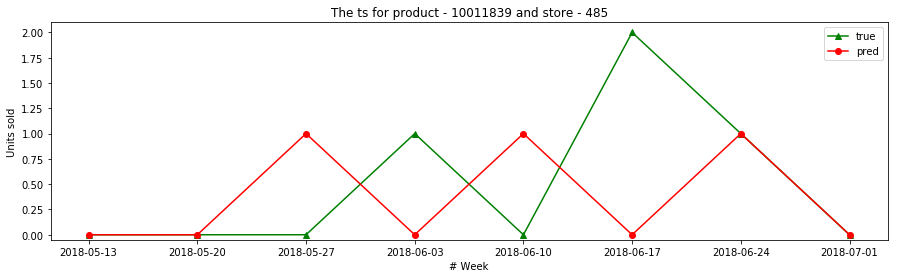

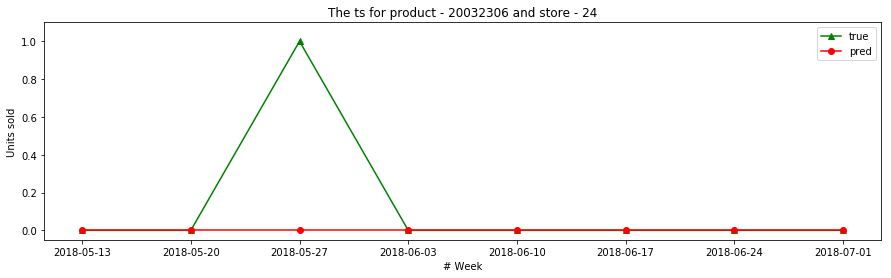

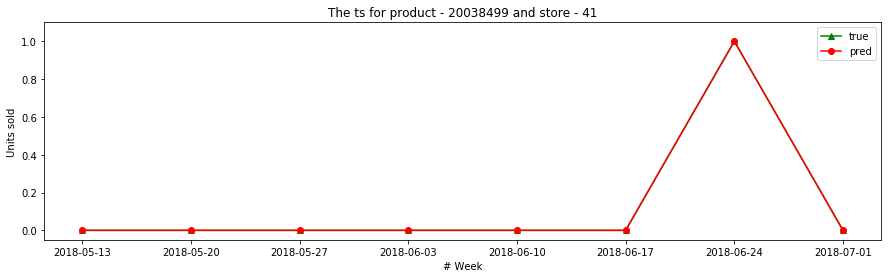

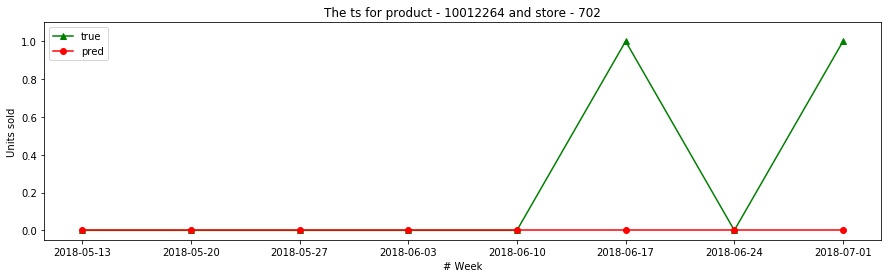

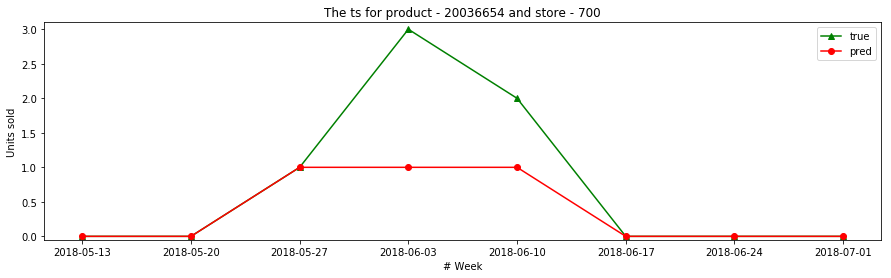

...

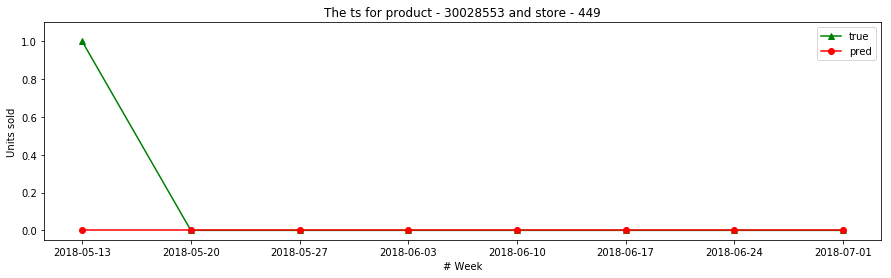

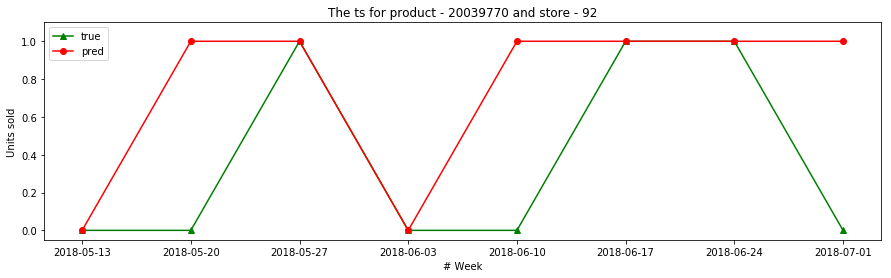

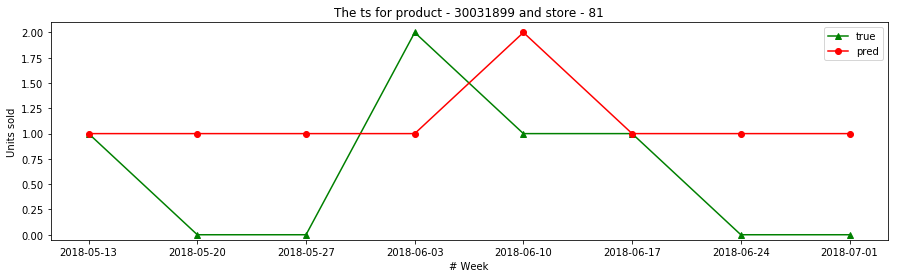

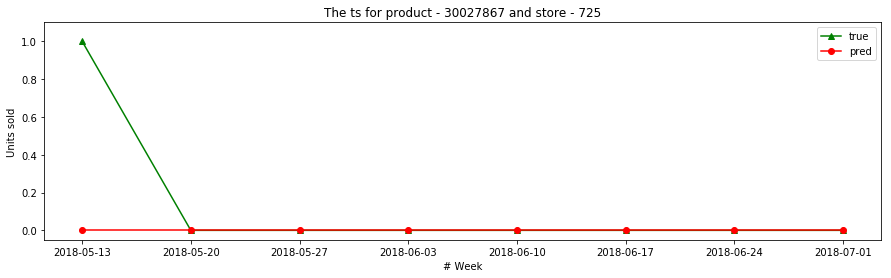

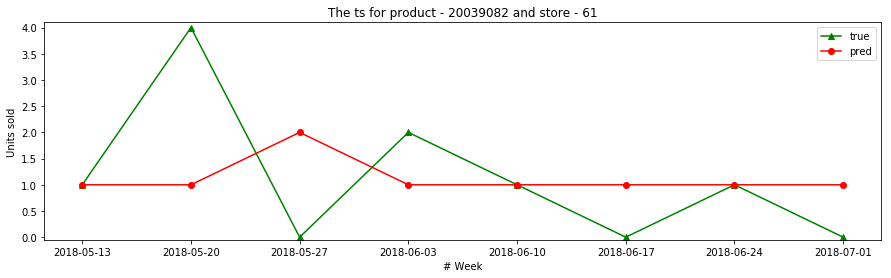

In [190]:
pairs = list(set(zip(res32['STORE_ID'], res32['PRODUCT_ID'])))

for i in range(len(pairs) // 100):
    store_id, product_id = pairs[i]
    plot_ts(res32, store_id, product_id)